In [1]:
import pandas as pd
import torch
import torchvision
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms as T
from torchvision.utils import make_grid
from torchvision.utils import save_image
from IPython.display import Image
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import random
import glob as glob
from __future__ import print_function, division
import os
from skimage import io, transform
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils

# Ignore warnings
import warnings
warnings.filterwarnings("ignore")

plt.ion()
# import wanb

In [2]:
# wandb.init(project="test-project", entity="autotetris")

In [3]:
images = glob.glob('C:/Users/guzma/OneDrive/Documents/TEC/DTU/02456/Project/Github_Project/autotetris/small_sample_out/*.jpeg')
print(f'Images in folder: {len(images)}')

Images in folder: 100


In [4]:
img_dir = next(iter(images))
X_train = torchvision.io.read_image(img_dir)
print(f"Shape of training data: {X_train.shape}")
print(f"Data type: {type(X_train)}")

Shape of training data: torch.Size([3, 500, 500])
Data type: <class 'torch.Tensor'>


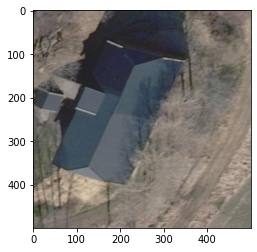

In [5]:
plt.imshow(X_train.permute(1, 2, 0))

In [6]:
from torchvision.models import resnet50
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Using {device} for inference')

Using cuda for inference


In [11]:
from os import walk

filenames = next(walk('C:/Users/guzma/OneDrive/Documents/TEC/DTU/02456/Project/Github_Project/autotetris/small_sample_out'), (None, None, []))[2]

In [7]:
data = pd.read_hdf('C:/Users/guzma/OneDrive/Documents/TEC/DTU/02456/Project/Github_Project/autotetris/small_sample_out/metadata_sample.hdf', '/d')

In [21]:
print(data.shape)
data.head()

(100, 7)


,building_id,image_buffer,image_provider,b_outline,b_surfaces,panel_polygons,panel_centroids
0,78a6cd53-5fe9-4a91-b328-be04817f73f1,15,C,"[[378, 112], [378, 387], [121, 387], [121, 112...","[[392, 134], [152, 404], [213, 450], [453, 180...","[[[172, 367], [154, 353], [164, 342], [182, 35...","[[168, 355], [149, 341], [178, 343], [159, 329..."
0,8724d454-483a-4e0d-8e4b-1f45666fd0c6,15,C,"[[395, 131], [395, 368], [104, 368], [104, 131...","[[[248, 335], [196, 184], [125, 223], [132, 24...","[[[142, 227], [159, 218], [164, 233], [148, 24...","[[153, 230], [170, 221], [187, 211], [176, 237..."
0,41f7159f-7cd1-45ab-87b1-1fa761ff2aba,15,C,"[[330, 130], [330, 369], [169, 369], [169, 130...","[[225, 298], [203, 424], [345, 439], [392, 171...","[[[281, 355], [246, 352], [250, 332], [284, 33...","[[265, 344], [230, 340], [195, 337], [269, 324..."
0,4df4d98d-4042-47c0-8331-1f63a5e536c7,15,C,"[[387, 145], [387, 354], [112, 354], [112, 145...","[[[260, 294], [246, 209], [165, 145], [139, 20...","[[[241, 232], [228, 259], [215, 249], [228, 22...","[[228, 240], [214, 230], [201, 219], [188, 209..."
0,71c524ac-1c82-4ba7-9731-0fc0d0f970a2,15,C,"[[329, 136], [126, 297], [171, 363], [174, 360...","[[394, 164], [152, 357], [205, 435], [209, 432...","[[[177, 353], [164, 335], [178, 323], [191, 34...","[[177, 338], [164, 319], [151, 301], [192, 327..."


In [23]:
n = 99
img_name = data.iloc[n, 0]
centroids = data.iloc[n, 6:]
centroids = np.asarray(centroids)
centroids = centroids.astype('float').reshape(-1, 2)

print('Image name: {}'.format(img_name))
print('centroids shape: {}'.format(centroids.shape))
print('First 4 centroids: {}'.format(centroids[:4]))

In [19]:
def show_centroids(image, centroids):
    """Show image with centroids"""
    plt.imshow(image)
    plt.scatter(centroids[:, 0], centroids[:, 1], s=10, marker='.', c='r')
    plt.pause(0.001)  # pause a bit so that plots are updated

plt.figure()
show_centroids(io.imread(os.path.join('data/faces/', img_name)),
               centroids)
plt.show()

NameError: name 'io' is not defined

<Figure size 432x288 with 0 Axes>

In [ ]:
from PIL import Image
from torchvision import prototype as P
img = Image.open("test/assets/encode_jpeg/grace_hopper_517x606.jpg")

# Initialize model
weights = P.models.ResNet50_Weights.IMAGENET1K_V2
model = P.models.resnet50(weights=weights)
model.eval()

# Initialize inference transforms
preprocess = weights.transforms()

# Apply inference preprocessing transforms
batch = preprocess(img).unsqueeze(0)
prediction = model(batch).squeeze(0).softmax(0)

# Make predictions
label = prediction.argmax().item()
score = prediction[label].item()

# Use meta to get the labels
category_name = weights.meta['categories'][label]
print(f"{category_name}: {100 * score}%")

## Extra

In [18]:
info = {}
for i in filenames:
    name = i.split('-b15')[0]
    # print(name)
    print(data[data['building_id'] == name]['panel_centroids'])
    # if data['building_id'] == name:
    #     info[name] = data['panel_centroids']

0    [[132, 317], [126, 293], [144, 311], [139, 288...
Name: panel_centroids, dtype: object
0    [[288, 286], [298, 302], [311, 322], [321, 338...
Name: panel_centroids, dtype: object
0    [[173, 191], [152, 205], [164, 174], [144, 188...
Name: panel_centroids, dtype: object
0    [[169, 283], [168, 255], [188, 283], [188, 255...
Name: panel_centroids, dtype: object
0    [[150, 304], [205, 261], [219, 250], [248, 262...
Name: panel_centroids, dtype: object
0    [[144, 172], [137, 185], [154, 196], [130, 197...
Name: panel_centroids, dtype: object
0    [[186, 224], [198, 194], [176, 210], [188, 179...
Name: panel_centroids, dtype: object
0    [[287, 157], [307, 179], [326, 201], [345, 223...
Name: panel_centroids, dtype: object
0    [[282, 267], [247, 267], [212, 267], [247, 250...
Name: panel_centroids, dtype: object
0    [[362, 321], [350, 343], [349, 312], [337, 334...
Name: panel_centroids, dtype: object
0    [[307, 112], [289, 112], [288, 132], [271, 112...
Name: panel_centroids, dt

In [8]:
resnet50 = torch.hub.load(data, 'nvidia_resnet50', pretrained=False)
utils = torch.hub.load(data, 'nvidia_convnets_processing_utils')

resnet50.eval().to(device)

AttributeError: 'DataFrame' object has no attribute 'split'

In [26]:
batch = torch.cat(
    [utils.prepare_input_from_uri(uri) for uri in images]
).to(device)

In [33]:
with torch.no_grad():
    output = torch.nn.functional.softmax(resnet50(batch), dim=1)
    
results = utils.pick_n_best(predictions=output, n=5)

sample 0: [('chiffonier, commode', '0.4%'), ('cleaver, meat cleaver, chopper', '0.3%'), ('bearskin, busby, shako', '0.3%'), ('garter snake, grass snake', '0.3%'), ('wire-haired fox terrier', '0.3%')]
sample 1: [('chiffonier, commode', '2.8%'), ('fire engine, fire truck', '1.3%'), ('odometer, hodometer, mileometer, milometer', '1.1%'), ('forklift', '1.0%'), ('picket fence, paling', '0.9%')]
sample 2: [('chiffonier, commode', '0.6%'), ('orangutan, orang, orangutang, Pongo pygmaeus', '0.3%'), ('odometer, hodometer, mileometer, milometer', '0.3%'), ('cleaver, meat cleaver, chopper', '0.3%'), ('castle', '0.3%')]
sample 3: [('chiffonier, commode', '0.4%'), ('bearskin, busby, shako', '0.3%'), ('garter snake, grass snake', '0.3%'), ('wire-haired fox terrier', '0.3%'), ('saltshaker, salt shaker', '0.3%')]
sample 4: [('chiffonier, commode', '1.0%'), ('fire engine, fire truck', '0.5%'), ('saltshaker, salt shaker', '0.4%'), ('odometer, hodometer, mileometer, milometer', '0.4%'), ('pillow', '0.4%')

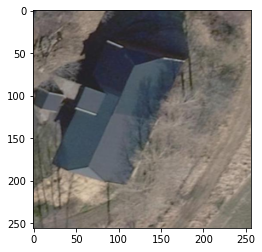

[('chiffonier, commode', '0.4%'), ('cleaver, meat cleaver, chopper', '0.3%'), ('bearskin, busby, shako', '0.3%'), ('garter snake, grass snake', '0.3%'), ('wire-haired fox terrier', '0.3%')]


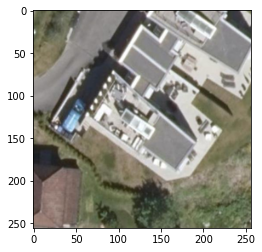

[('chiffonier, commode', '2.8%'), ('fire engine, fire truck', '1.3%'), ('odometer, hodometer, mileometer, milometer', '1.1%'), ('forklift', '1.0%'), ('picket fence, paling', '0.9%')]


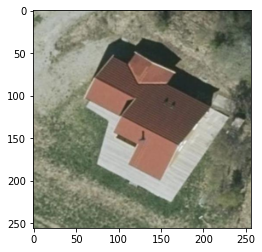

[('chiffonier, commode', '0.6%'), ('orangutan, orang, orangutang, Pongo pygmaeus', '0.3%'), ('odometer, hodometer, mileometer, milometer', '0.3%'), ('cleaver, meat cleaver, chopper', '0.3%'), ('castle', '0.3%')]


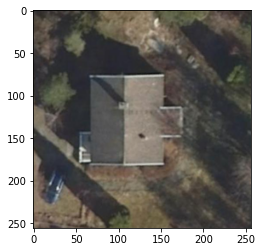

[('chiffonier, commode', '0.4%'), ('bearskin, busby, shako', '0.3%'), ('garter snake, grass snake', '0.3%'), ('wire-haired fox terrier', '0.3%'), ('saltshaker, salt shaker', '0.3%')]


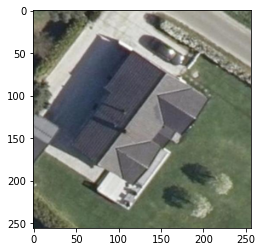

[('chiffonier, commode', '1.0%'), ('fire engine, fire truck', '0.5%'), ('saltshaker, salt shaker', '0.4%'), ('odometer, hodometer, mileometer, milometer', '0.4%'), ('pillow', '0.4%')]


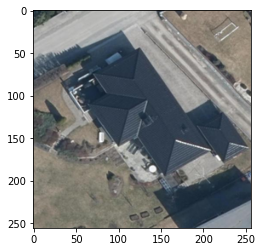

[('chiffonier, commode', '0.6%'), ('saltshaker, salt shaker', '0.4%'), ('garter snake, grass snake', '0.3%'), ('bearskin, busby, shako', '0.3%'), ('cleaver, meat cleaver, chopper', '0.3%')]


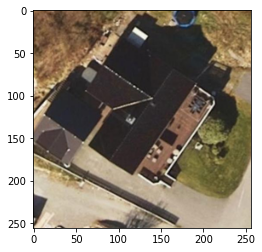

[('chiffonier, commode', '2.7%'), ('fire engine, fire truck', '1.3%'), ('forklift', '1.1%'), ('odometer, hodometer, mileometer, milometer', '1.0%'), ('miniskirt, mini', '0.8%')]


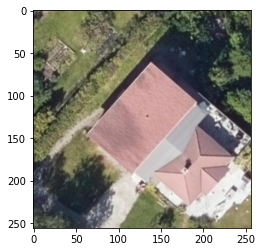

[('chiffonier, commode', '0.8%'), ('fire engine, fire truck', '0.5%'), ('bearskin, busby, shako', '0.4%'), ('miniskirt, mini', '0.4%'), ('odometer, hodometer, mileometer, milometer', '0.4%')]


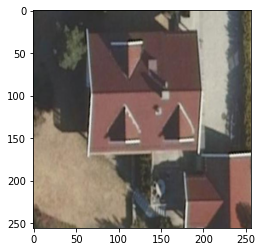

[('chiffonier, commode', '0.6%'), ('bearskin, busby, shako', '0.4%'), ('cleaver, meat cleaver, chopper', '0.3%'), ('saltshaker, salt shaker', '0.3%'), ('digital watch', '0.3%')]


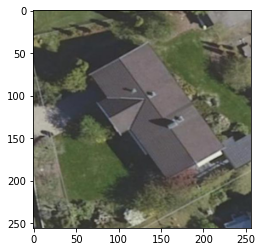

[('chiffonier, commode', '0.4%'), ('wire-haired fox terrier', '0.3%'), ('garter snake, grass snake', '0.3%'), ('bearskin, busby, shako', '0.3%'), ('orangutan, orang, orangutang, Pongo pygmaeus', '0.3%')]


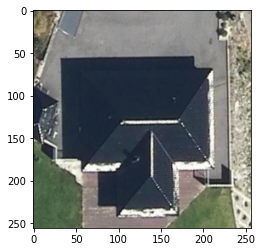

[('chiffonier, commode', '3.6%'), ('fire engine, fire truck', '2.0%'), ('odometer, hodometer, mileometer, milometer', '1.5%'), ('picket fence, paling', '1.2%'), ('forklift', '1.0%')]


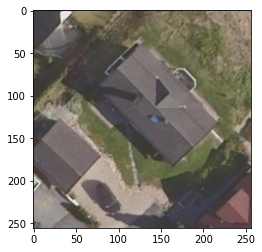

[('chiffonier, commode', '0.4%'), ('cleaver, meat cleaver, chopper', '0.3%'), ('garter snake, grass snake', '0.3%'), ('bearskin, busby, shako', '0.3%'), ('wire-haired fox terrier', '0.3%')]


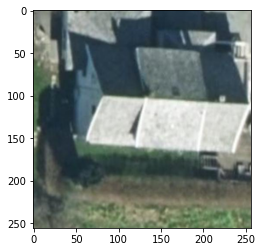

[('chiffonier, commode', '0.8%'), ('saltshaker, salt shaker', '0.4%'), ('odometer, hodometer, mileometer, milometer', '0.4%'), ('bearskin, busby, shako', '0.4%'), ('digital watch', '0.4%')]


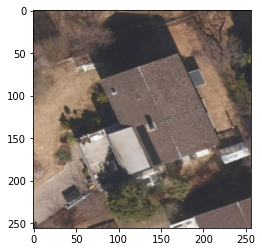

[('chiffonier, commode', '0.5%'), ('bearskin, busby, shako', '0.3%'), ('garter snake, grass snake', '0.3%'), ('cleaver, meat cleaver, chopper', '0.3%'), ('saltshaker, salt shaker', '0.3%')]


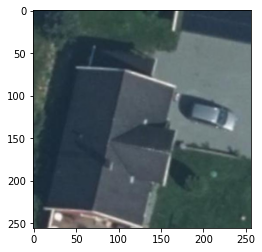

[('chiffonier, commode', '0.4%'), ('cleaver, meat cleaver, chopper', '0.3%'), ('garter snake, grass snake', '0.3%'), ('wire-haired fox terrier', '0.3%'), ('orangutan, orang, orangutang, Pongo pygmaeus', '0.3%')]


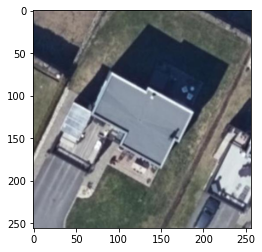

[('chiffonier, commode', '1.7%'), ('fire engine, fire truck', '0.7%'), ('odometer, hodometer, mileometer, milometer', '0.6%'), ('picket fence, paling', '0.5%'), ('miniskirt, mini', '0.5%')]


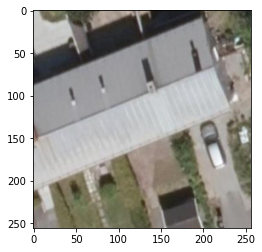

[('chiffonier, commode', '0.5%'), ('saltshaker, salt shaker', '0.3%'), ('garter snake, grass snake', '0.3%'), ('castle', '0.3%'), ('bearskin, busby, shako', '0.3%')]


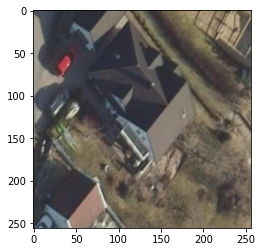

[('chiffonier, commode', '0.5%'), ('wire-haired fox terrier', '0.3%'), ('bearskin, busby, shako', '0.3%'), ('orangutan, orang, orangutang, Pongo pygmaeus', '0.3%'), ('garter snake, grass snake', '0.3%')]


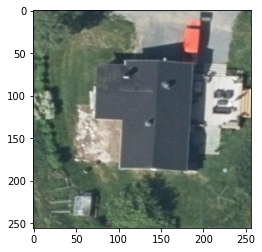

[('chiffonier, commode', '0.6%'), ('saltshaker, salt shaker', '0.4%'), ('garter snake, grass snake', '0.3%'), ('oxcart', '0.3%'), ('cleaver, meat cleaver, chopper', '0.3%')]


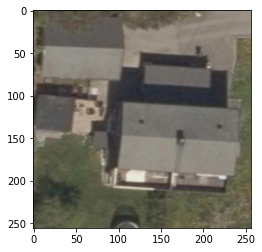

[('chiffonier, commode', '0.4%'), ('bearskin, busby, shako', '0.3%'), ('garter snake, grass snake', '0.3%'), ('cleaver, meat cleaver, chopper', '0.3%'), ('wire-haired fox terrier', '0.3%')]


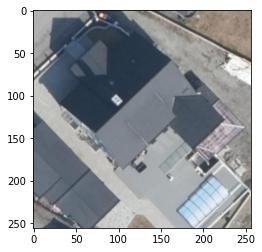

[('chiffonier, commode', '0.6%'), ('bearskin, busby, shako', '0.4%'), ('saltshaker, salt shaker', '0.4%'), ('wire-haired fox terrier', '0.3%'), ('garter snake, grass snake', '0.3%')]


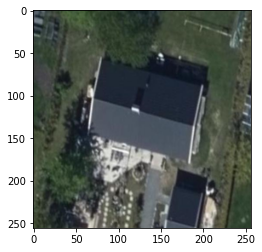

[('chiffonier, commode', '0.7%'), ('fire engine, fire truck', '0.4%'), ('bearskin, busby, shako', '0.4%'), ('digital watch', '0.3%'), ('saltshaker, salt shaker', '0.3%')]


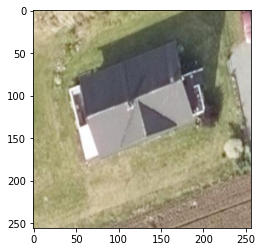

[('chiffonier, commode', '0.6%'), ('cleaver, meat cleaver, chopper', '0.4%'), ('bearskin, busby, shako', '0.3%'), ('saltshaker, salt shaker', '0.3%'), ('garter snake, grass snake', '0.3%')]


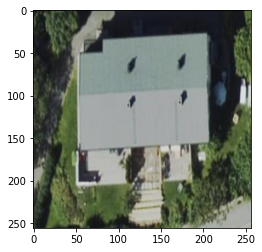

[('chiffonier, commode', '0.7%'), ('bearskin, busby, shako', '0.4%'), ('fire engine, fire truck', '0.4%'), ('odometer, hodometer, mileometer, milometer', '0.4%'), ('wire-haired fox terrier', '0.3%')]


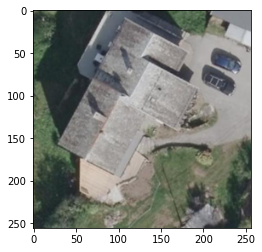

[('chiffonier, commode', '0.5%'), ('cleaver, meat cleaver, chopper', '0.4%'), ('fire engine, fire truck', '0.3%'), ('garter snake, grass snake', '0.3%'), ('castle', '0.3%')]


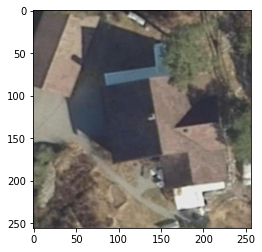

[('chiffonier, commode', '0.4%'), ('cleaver, meat cleaver, chopper', '0.3%'), ('garter snake, grass snake', '0.3%'), ('saltshaker, salt shaker', '0.3%'), ('wire-haired fox terrier', '0.3%')]


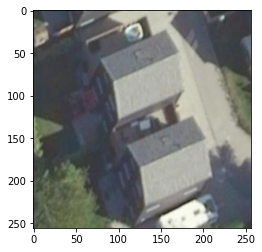

[('chiffonier, commode', '0.4%'), ('cleaver, meat cleaver, chopper', '0.3%'), ('garter snake, grass snake', '0.3%'), ('bearskin, busby, shako', '0.3%'), ('saltshaker, salt shaker', '0.3%')]


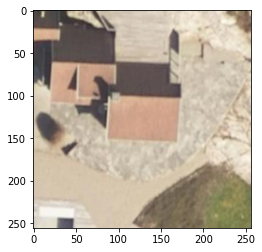

[('chiffonier, commode', '0.5%'), ('bearskin, busby, shako', '0.3%'), ('wire-haired fox terrier', '0.3%'), ('Christmas stocking', '0.3%'), ('saltshaker, salt shaker', '0.3%')]


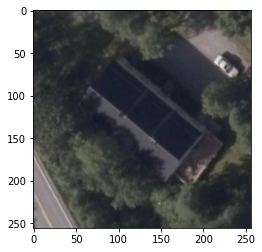

[('chiffonier, commode', '0.4%'), ('garter snake, grass snake', '0.3%'), ('orangutan, orang, orangutang, Pongo pygmaeus', '0.3%'), ('cleaver, meat cleaver, chopper', '0.3%'), ('bearskin, busby, shako', '0.3%')]


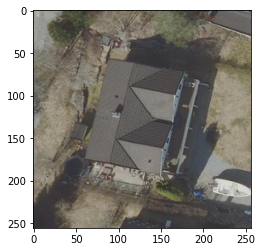

[('chiffonier, commode', '0.4%'), ('bearskin, busby, shako', '0.3%'), ('cleaver, meat cleaver, chopper', '0.3%'), ('orangutan, orang, orangutang, Pongo pygmaeus', '0.3%'), ('garter snake, grass snake', '0.3%')]


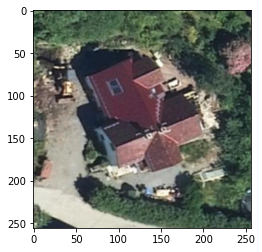

[('chiffonier, commode', '1.8%'), ('odometer, hodometer, mileometer, milometer', '1.0%'), ('fire engine, fire truck', '0.7%'), ('picket fence, paling', '0.6%'), ('miniskirt, mini', '0.6%')]


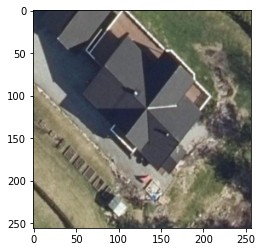

[('chiffonier, commode', '0.8%'), ('saltshaker, salt shaker', '0.5%'), ('bearskin, busby, shako', '0.4%'), ('fire engine, fire truck', '0.4%'), ('digital watch', '0.4%')]


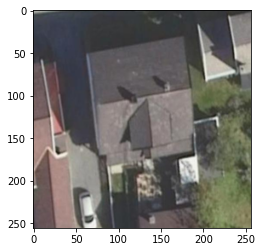

[('chiffonier, commode', '0.5%'), ('garter snake, grass snake', '0.3%'), ('orangutan, orang, orangutang, Pongo pygmaeus', '0.3%'), ('digital watch', '0.3%'), ('bearskin, busby, shako', '0.3%')]


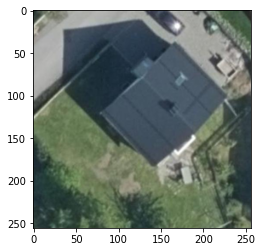

[('chiffonier, commode', '0.4%'), ('cleaver, meat cleaver, chopper', '0.3%'), ('saltshaker, salt shaker', '0.3%'), ('bearskin, busby, shako', '0.3%'), ('wire-haired fox terrier', '0.3%')]


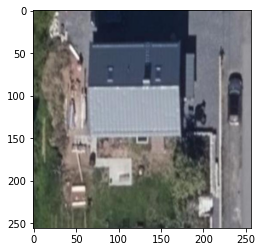

[('chiffonier, commode', '0.5%'), ('bearskin, busby, shako', '0.4%'), ('digital watch', '0.3%'), ('saltshaker, salt shaker', '0.3%'), ('toyshop', '0.3%')]


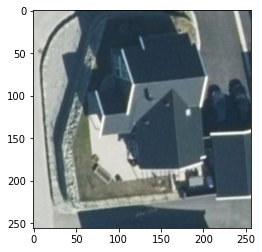

[('chiffonier, commode', '0.8%'), ('odometer, hodometer, mileometer, milometer', '0.4%'), ('saltshaker, salt shaker', '0.4%'), ('pillow', '0.4%'), ('fire engine, fire truck', '0.4%')]


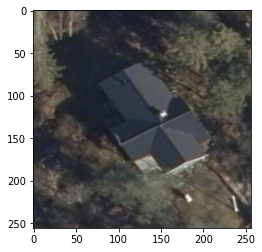

[('cleaver, meat cleaver, chopper', '0.3%'), ('chiffonier, commode', '0.3%'), ('garter snake, grass snake', '0.3%'), ('digital watch', '0.3%'), ('saltshaker, salt shaker', '0.3%')]


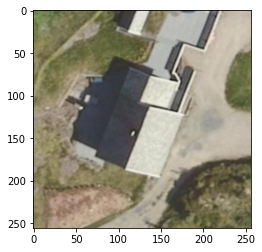

[('chiffonier, commode', '1.2%'), ('odometer, hodometer, mileometer, milometer', '0.6%'), ('fire engine, fire truck', '0.6%'), ('Christmas stocking', '0.5%'), ('digital watch', '0.5%')]


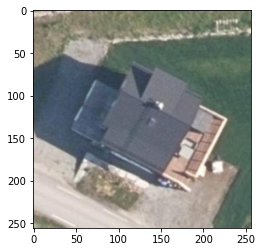

[('chiffonier, commode', '0.6%'), ('bearskin, busby, shako', '0.4%'), ('orangutan, orang, orangutang, Pongo pygmaeus', '0.3%'), ('fire engine, fire truck', '0.3%'), ('wire-haired fox terrier', '0.3%')]


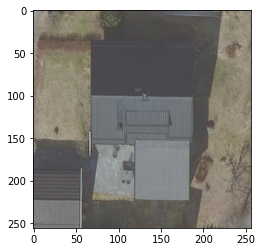

[('chiffonier, commode', '0.4%'), ('wire-haired fox terrier', '0.3%'), ('bearskin, busby, shako', '0.3%'), ('garter snake, grass snake', '0.3%'), ('orangutan, orang, orangutang, Pongo pygmaeus', '0.3%')]


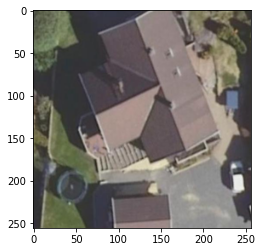

[('chiffonier, commode', '0.4%'), ('wire-haired fox terrier', '0.3%'), ('bearskin, busby, shako', '0.3%'), ('orangutan, orang, orangutang, Pongo pygmaeus', '0.3%'), ('cleaver, meat cleaver, chopper', '0.3%')]


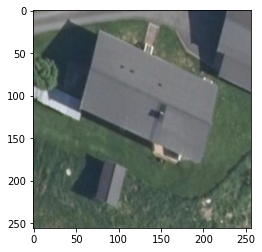

[('chiffonier, commode', '0.4%'), ('castle', '0.3%'), ('saltshaker, salt shaker', '0.3%'), ('bearskin, busby, shako', '0.3%'), ('garter snake, grass snake', '0.3%')]


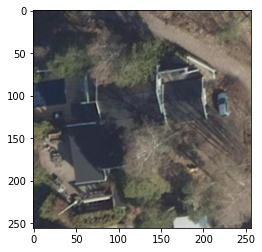

[('chiffonier, commode', '0.5%'), ('bearskin, busby, shako', '0.3%'), ('garter snake, grass snake', '0.3%'), ('orangutan, orang, orangutang, Pongo pygmaeus', '0.3%'), ('cleaver, meat cleaver, chopper', '0.3%')]


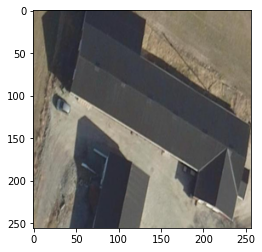

[('chiffonier, commode', '0.4%'), ('bearskin, busby, shako', '0.3%'), ('saltshaker, salt shaker', '0.3%'), ('wire-haired fox terrier', '0.3%'), ('garter snake, grass snake', '0.3%')]


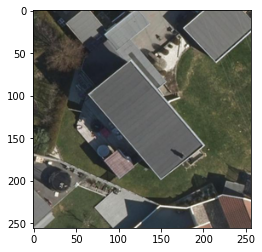

[('chiffonier, commode', '1.1%'), ('fire engine, fire truck', '0.6%'), ('odometer, hodometer, mileometer, milometer', '0.6%'), ('picket fence, paling', '0.4%'), ('pillow', '0.4%')]


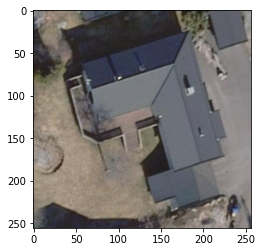

[('chiffonier, commode', '0.4%'), ('bearskin, busby, shako', '0.3%'), ('saltshaker, salt shaker', '0.3%'), ('digital watch', '0.3%'), ('cleaver, meat cleaver, chopper', '0.3%')]


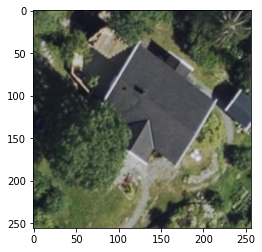

[('chiffonier, commode', '0.6%'), ('fire engine, fire truck', '0.4%'), ('Christmas stocking', '0.4%'), ('odometer, hodometer, mileometer, milometer', '0.4%'), ('garter snake, grass snake', '0.3%')]


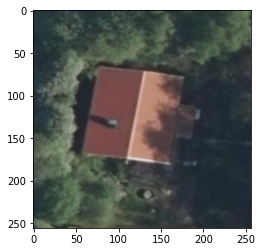

[('chiffonier, commode', '0.4%'), ('bearskin, busby, shako', '0.3%'), ('garter snake, grass snake', '0.3%'), ('digital watch', '0.3%'), ('tench, Tinca tinca', '0.3%')]


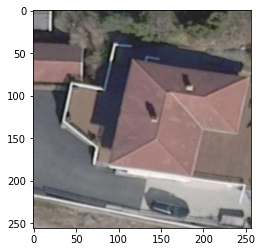

[('chiffonier, commode', '0.8%'), ('odometer, hodometer, mileometer, milometer', '0.4%'), ('saltshaker, salt shaker', '0.4%'), ('digital watch', '0.4%'), ('fire engine, fire truck', '0.4%')]


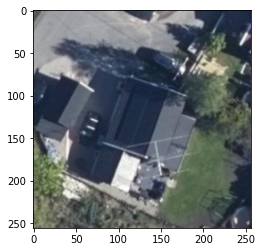

[('chiffonier, commode', '0.9%'), ('odometer, hodometer, mileometer, milometer', '0.5%'), ('fire engine, fire truck', '0.4%'), ('bearskin, busby, shako', '0.4%'), ('digital watch', '0.4%')]


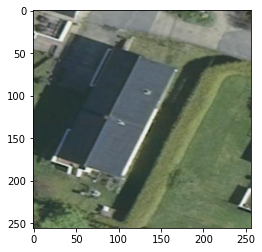

[('chiffonier, commode', '0.9%'), ('fire engine, fire truck', '0.6%'), ('digital watch', '0.4%'), ('saltshaker, salt shaker', '0.4%'), ('oxcart', '0.4%')]


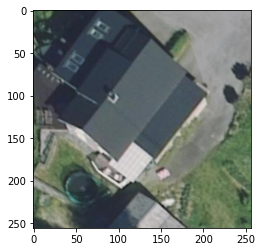

[('chiffonier, commode', '0.5%'), ('bearskin, busby, shako', '0.4%'), ('saltshaker, salt shaker', '0.4%'), ('garter snake, grass snake', '0.4%'), ('digital watch', '0.3%')]


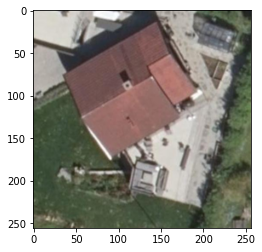

[('chiffonier, commode', '0.6%'), ('odometer, hodometer, mileometer, milometer', '0.4%'), ('bearskin, busby, shako', '0.4%'), ('Christmas stocking', '0.4%'), ('garter snake, grass snake', '0.3%')]


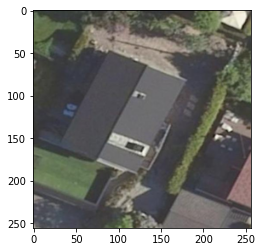

[('chiffonier, commode', '0.5%'), ('saltshaker, salt shaker', '0.3%'), ('bearskin, busby, shako', '0.3%'), ('garter snake, grass snake', '0.3%'), ('cleaver, meat cleaver, chopper', '0.3%')]


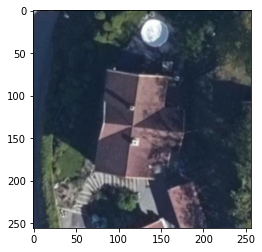

[('chiffonier, commode', '0.5%'), ('cleaver, meat cleaver, chopper', '0.4%'), ('saltshaker, salt shaker', '0.4%'), ('orangutan, orang, orangutang, Pongo pygmaeus', '0.3%'), ('fire engine, fire truck', '0.3%')]


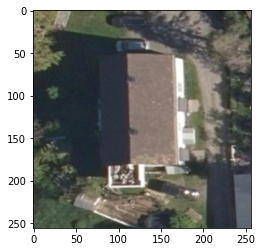

[('chiffonier, commode', '0.7%'), ('saltshaker, salt shaker', '0.4%'), ('orangutan, orang, orangutang, Pongo pygmaeus', '0.4%'), ('bearskin, busby, shako', '0.4%'), ('mountain tent', '0.4%')]


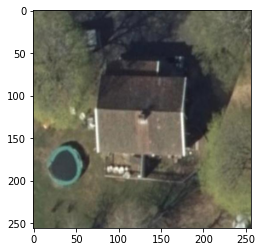

[('chiffonier, commode', '0.4%'), ('bearskin, busby, shako', '0.3%'), ('wire-haired fox terrier', '0.3%'), ('orangutan, orang, orangutang, Pongo pygmaeus', '0.3%'), ('garter snake, grass snake', '0.3%')]


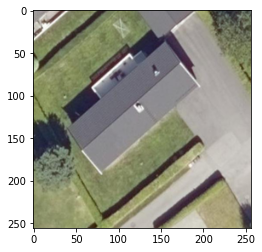

[('chiffonier, commode', '0.9%'), ('fire engine, fire truck', '0.5%'), ('saltshaker, salt shaker', '0.4%'), ('digital watch', '0.4%'), ('odometer, hodometer, mileometer, milometer', '0.4%')]


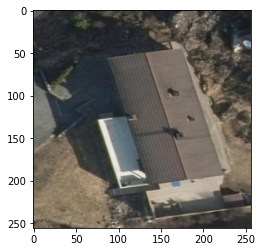

[('chiffonier, commode', '0.4%'), ('bearskin, busby, shako', '0.3%'), ('saltshaker, salt shaker', '0.3%'), ('orangutan, orang, orangutang, Pongo pygmaeus', '0.3%'), ('cleaver, meat cleaver, chopper', '0.3%')]


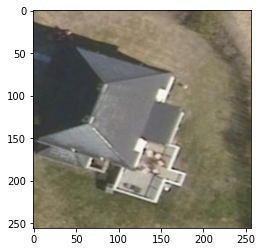

[('chiffonier, commode', '0.6%'), ('garter snake, grass snake', '0.4%'), ('bearskin, busby, shako', '0.4%'), ('fire engine, fire truck', '0.4%'), ('saltshaker, salt shaker', '0.3%')]


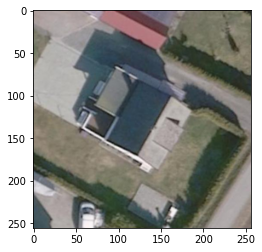

[('chiffonier, commode', '0.8%'), ('digital watch', '0.4%'), ('garter snake, grass snake', '0.4%'), ('saltshaker, salt shaker', '0.4%'), ('fire engine, fire truck', '0.4%')]


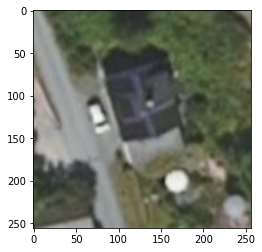

[('chiffonier, commode', '0.4%'), ('bearskin, busby, shako', '0.3%'), ('cleaver, meat cleaver, chopper', '0.3%'), ('garter snake, grass snake', '0.3%'), ('castle', '0.3%')]


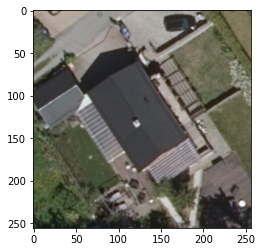

[('chiffonier, commode', '0.6%'), ('bearskin, busby, shako', '0.4%'), ('digital watch', '0.4%'), ('cleaver, meat cleaver, chopper', '0.3%'), ('saltshaker, salt shaker', '0.3%')]


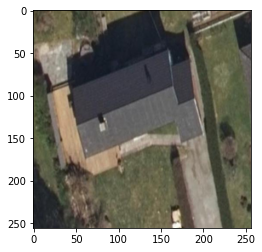

[('chiffonier, commode', '0.4%'), ('garter snake, grass snake', '0.3%'), ('bearskin, busby, shako', '0.3%'), ('saltshaker, salt shaker', '0.3%'), ('orangutan, orang, orangutang, Pongo pygmaeus', '0.3%')]


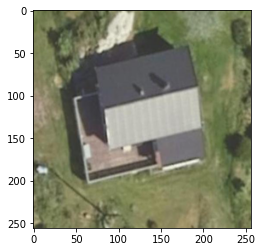

[('chiffonier, commode', '0.5%'), ('garter snake, grass snake', '0.3%'), ('wire-haired fox terrier', '0.3%'), ('saltshaker, salt shaker', '0.3%'), ('bearskin, busby, shako', '0.3%')]


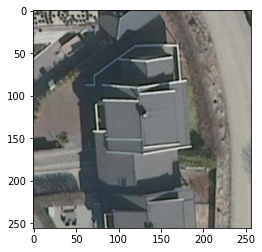

[('chiffonier, commode', '1.6%'), ('fire engine, fire truck', '0.7%'), ('odometer, hodometer, mileometer, milometer', '0.6%'), ('bearskin, busby, shako', '0.5%'), ('picket fence, paling', '0.5%')]


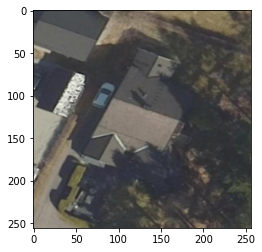

[('chiffonier, commode', '0.4%'), ('bearskin, busby, shako', '0.4%'), ('garter snake, grass snake', '0.3%'), ('saltshaker, salt shaker', '0.3%'), ('cleaver, meat cleaver, chopper', '0.3%')]


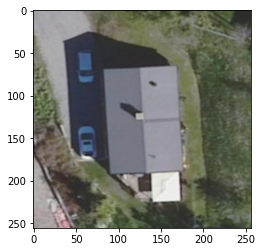

[('chiffonier, commode', '0.6%'), ('bearskin, busby, shako', '0.3%'), ('saltshaker, salt shaker', '0.3%'), ('garter snake, grass snake', '0.3%'), ('oxcart', '0.3%')]


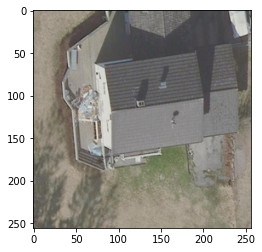

[('chiffonier, commode', '0.5%'), ('cleaver, meat cleaver, chopper', '0.3%'), ('bearskin, busby, shako', '0.3%'), ('garter snake, grass snake', '0.3%'), ('saltshaker, salt shaker', '0.3%')]


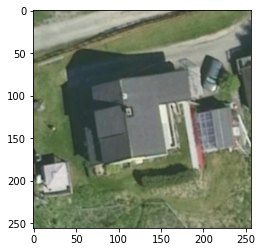

[('chiffonier, commode', '0.5%'), ('orangutan, orang, orangutang, Pongo pygmaeus', '0.4%'), ('bearskin, busby, shako', '0.3%'), ('saltshaker, salt shaker', '0.3%'), ('digital watch', '0.3%')]


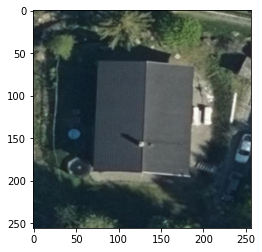

[('chiffonier, commode', '0.4%'), ('saltshaker, salt shaker', '0.3%'), ('Christmas stocking', '0.3%'), ('orangutan, orang, orangutang, Pongo pygmaeus', '0.3%'), ('bearskin, busby, shako', '0.3%')]


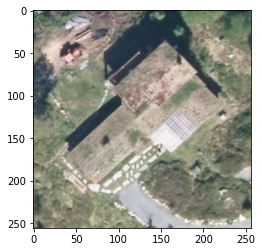

[('chiffonier, commode', '0.7%'), ('odometer, hodometer, mileometer, milometer', '0.4%'), ('fire engine, fire truck', '0.4%'), ('orangutan, orang, orangutang, Pongo pygmaeus', '0.4%'), ('saltshaker, salt shaker', '0.4%')]


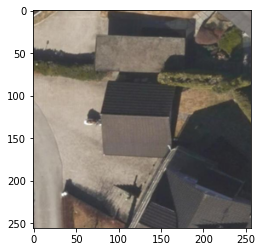

[('chiffonier, commode', '0.4%'), ('bearskin, busby, shako', '0.3%'), ('wire-haired fox terrier', '0.3%'), ('orangutan, orang, orangutang, Pongo pygmaeus', '0.3%'), ('garter snake, grass snake', '0.3%')]


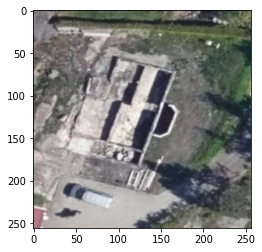

[('chiffonier, commode', '2.2%'), ('fire engine, fire truck', '1.1%'), ('forklift', '0.9%'), ('odometer, hodometer, mileometer, milometer', '0.8%'), ('oxcart', '0.7%')]


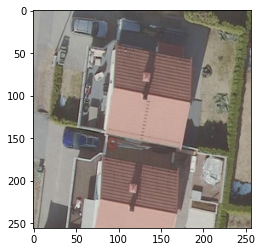

[('chiffonier, commode', '0.5%'), ('odometer, hodometer, mileometer, milometer', '0.3%'), ('garter snake, grass snake', '0.3%'), ('saltshaker, salt shaker', '0.3%'), ('wire-haired fox terrier', '0.3%')]


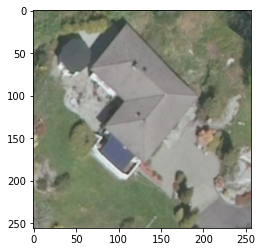

[('chiffonier, commode', '0.5%'), ('bearskin, busby, shako', '0.3%'), ('saltshaker, salt shaker', '0.3%'), ('orangutan, orang, orangutang, Pongo pygmaeus', '0.3%'), ('digital watch', '0.3%')]


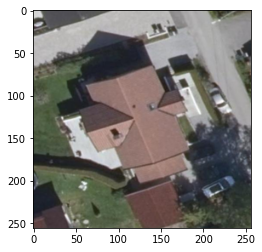

[('chiffonier, commode', '0.7%'), ('odometer, hodometer, mileometer, milometer', '0.4%'), ('fire engine, fire truck', '0.4%'), ('Christmas stocking', '0.4%'), ('digital watch', '0.3%')]


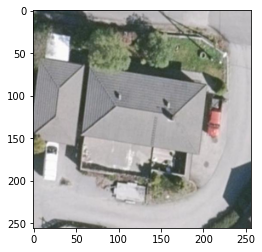

[('chiffonier, commode', '1.0%'), ('odometer, hodometer, mileometer, milometer', '0.5%'), ('fire engine, fire truck', '0.5%'), ('digital watch', '0.4%'), ('bearskin, busby, shako', '0.4%')]


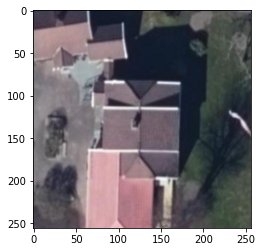

[('chiffonier, commode', '0.6%'), ('bearskin, busby, shako', '0.3%'), ('fire engine, fire truck', '0.3%'), ('odometer, hodometer, mileometer, milometer', '0.3%'), ('saltshaker, salt shaker', '0.3%')]


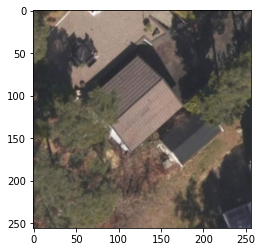

[('chiffonier, commode', '0.4%'), ('cleaver, meat cleaver, chopper', '0.3%'), ('bearskin, busby, shako', '0.3%'), ('saltshaker, salt shaker', '0.3%'), ('garter snake, grass snake', '0.3%')]


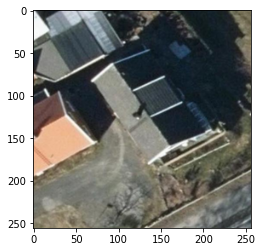

[('chiffonier, commode', '1.8%'), ('fire engine, fire truck', '1.2%'), ('odometer, hodometer, mileometer, milometer', '1.1%'), ('miniskirt, mini', '0.7%'), ('forklift', '0.7%')]


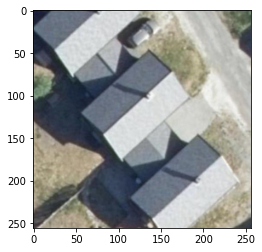

[('chiffonier, commode', '0.8%'), ('fire engine, fire truck', '0.4%'), ('odometer, hodometer, mileometer, milometer', '0.4%'), ('cleaver, meat cleaver, chopper', '0.4%'), ('Christmas stocking', '0.4%')]


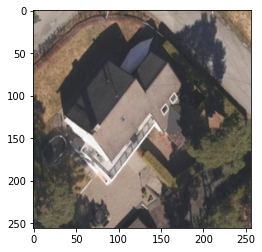

[('chiffonier, commode', '0.7%'), ('fire engine, fire truck', '0.4%'), ('bearskin, busby, shako', '0.4%'), ('digital watch', '0.4%'), ('saltshaker, salt shaker', '0.4%')]


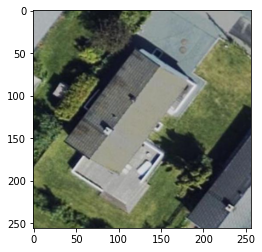

[('chiffonier, commode', '0.8%'), ('fire engine, fire truck', '0.4%'), ('odometer, hodometer, mileometer, milometer', '0.4%'), ('bearskin, busby, shako', '0.4%'), ('miniskirt, mini', '0.4%')]


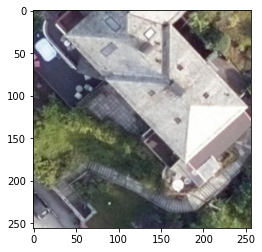

[('chiffonier, commode', '1.1%'), ('fire engine, fire truck', '0.5%'), ('forklift', '0.5%'), ('saltshaker, salt shaker', '0.4%'), ('odometer, hodometer, mileometer, milometer', '0.4%')]


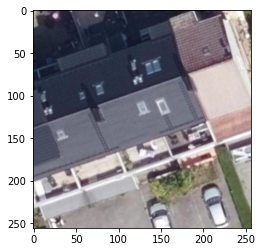

[('chiffonier, commode', '1.2%'), ('fire engine, fire truck', '0.5%'), ('bearskin, busby, shako', '0.5%'), ('picket fence, paling', '0.5%'), ('saltshaker, salt shaker', '0.5%')]


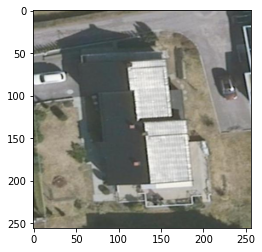

[('chiffonier, commode', '1.0%'), ('odometer, hodometer, mileometer, milometer', '0.5%'), ('saltshaker, salt shaker', '0.5%'), ('fire engine, fire truck', '0.5%'), ('oxcart', '0.4%')]


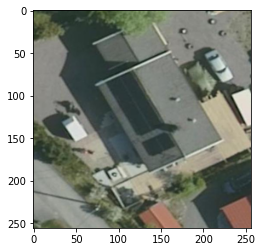

[('chiffonier, commode', '0.5%'), ('bearskin, busby, shako', '0.3%'), ('wire-haired fox terrier', '0.3%'), ('garter snake, grass snake', '0.3%'), ('saltshaker, salt shaker', '0.3%')]


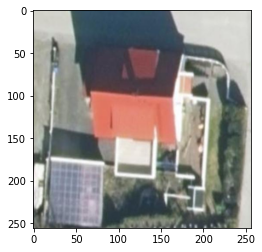

[('chiffonier, commode', '1.6%'), ('fire engine, fire truck', '0.8%'), ('odometer, hodometer, mileometer, milometer', '0.7%'), ('forklift', '0.6%'), ('miniskirt, mini', '0.6%')]


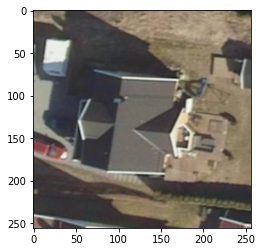

[('chiffonier, commode', '0.9%'), ('odometer, hodometer, mileometer, milometer', '0.5%'), ('fire engine, fire truck', '0.5%'), ('saltshaker, salt shaker', '0.5%'), ('digital watch', '0.4%')]


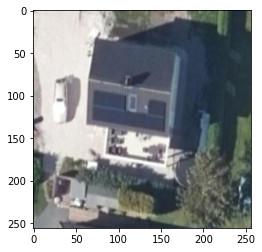

[('chiffonier, commode', '1.0%'), ('saltshaker, salt shaker', '0.6%'), ('odometer, hodometer, mileometer, milometer', '0.5%'), ('picket fence, paling', '0.5%'), ('fire engine, fire truck', '0.5%')]


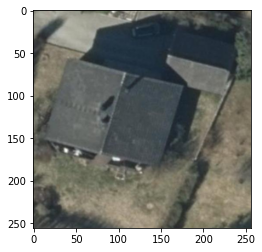

[('chiffonier, commode', '0.4%'), ('cleaver, meat cleaver, chopper', '0.3%'), ('bearskin, busby, shako', '0.3%'), ('digital watch', '0.3%'), ('garter snake, grass snake', '0.3%')]


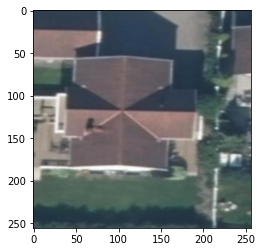

[('chiffonier, commode', '0.5%'), ('cleaver, meat cleaver, chopper', '0.3%'), ('wire-haired fox terrier', '0.3%'), ('garter snake, grass snake', '0.3%'), ('fire engine, fire truck', '0.3%')]


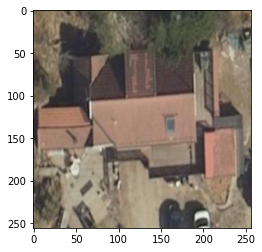

[('chiffonier, commode', '0.4%'), ('cleaver, meat cleaver, chopper', '0.3%'), ('saltshaker, salt shaker', '0.3%'), ('garter snake, grass snake', '0.3%'), ('bearskin, busby, shako', '0.3%')]


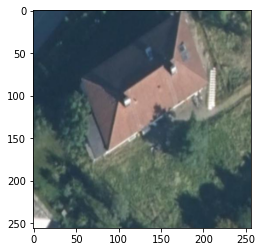

[('chiffonier, commode', '0.4%'), ('cleaver, meat cleaver, chopper', '0.3%'), ('digital watch', '0.3%'), ('garter snake, grass snake', '0.3%'), ('bearskin, busby, shako', '0.3%')]


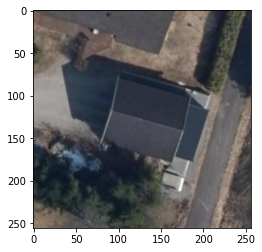

[('chiffonier, commode', '0.4%'), ('bearskin, busby, shako', '0.3%'), ('cleaver, meat cleaver, chopper', '0.3%'), ('garter snake, grass snake', '0.3%'), ('orangutan, orang, orangutang, Pongo pygmaeus', '0.3%')]


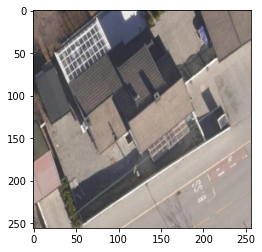

[('chiffonier, commode', '0.9%'), ('fire engine, fire truck', '0.5%'), ('bearskin, busby, shako', '0.4%'), ('saltshaker, salt shaker', '0.4%'), ('digital watch', '0.4%')]


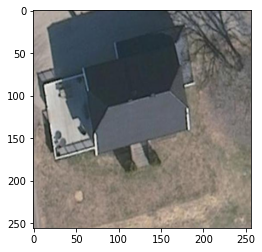

[('chiffonier, commode', '0.5%'), ('bearskin, busby, shako', '0.4%'), ('cleaver, meat cleaver, chopper', '0.3%'), ('saltshaker, salt shaker', '0.3%'), ('banded gecko', '0.3%')]


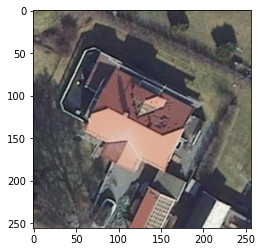

[('chiffonier, commode', '1.6%'), ('odometer, hodometer, mileometer, milometer', '0.7%'), ('fire engine, fire truck', '0.7%'), ('forklift', '0.6%'), ('oxcart', '0.6%')]


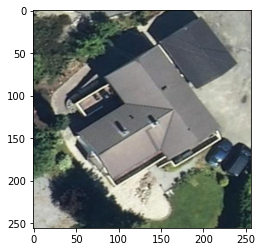

[('chiffonier, commode', '3.9%'), ('fire engine, fire truck', '2.1%'), ('odometer, hodometer, mileometer, milometer', '1.8%'), ('oxcart', '1.4%'), ('miniskirt, mini', '1.3%')]


In [36]:
for uri, result in zip(images, results):
    img = Image.open(uri)
    img.thumbnail((256,256), Image.ANTIALIAS)
    plt.imshow(img)
    plt.show()
    print(result)